# DC-GAN

In [4]:
import random
import torch

import torch.nn as nn
import torchvision.datasets as vision_datasets
from torch.utils.data import DataLoader
import torchvision.transforms as transforms
# plot celebrity faces from dataset.
import torchvision.utils as vutils
import torch.optim as optim

import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import HTML

# for reproducibility
seed = 999
random.seed(seed)
torch.manual_seed(seed)

## Set up parameters that'll be useful later

In [2]:
# setting up some parameters for this notebook
dataset_path = 'data/celeba'
dataloading_workers = 2
batch_size = 120
image_size = 64
num_channels = 3
latent_vector_dim = 100
gen_feature_map_dim = 64
disc_feature_map_dim = 64
num_epochs = 5
lr = 0.0002
beta1 = 0.5 # adam optimizer param from the DCGAN paper.
num_gpu = 1

## Load in Dataset and visualize a few of them

torch.Size([64, 3, 64, 64])


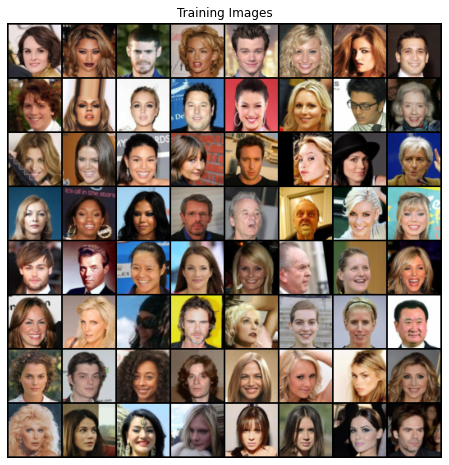

In [16]:
celeb_data = vision_datasets.ImageFolder(root=dataset_path,
                                         transform=transforms.Compose([
                                             transforms.Resize(image_size),
                                             transforms.CenterCrop(image_size),
                                             transforms.ToTensor(),
                                             transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))
                                         ]))

celeb_data_loader = DataLoader(dataset=celeb_data,
                               batch_size=batch_size,
                               shuffle=True,
                               num_workers=dataloading_workers)

device = 'cuda' if (torch.cuda.is_available() and num_gpu > 0) else 'cpu'

real_data_batch = next(iter(celeb_data_loader))
print(real_data_batch[0][:64].shape)
# lets plot this a few photos from this real_data_batch
plt.figure(figsize=(8,8))
plt.axis("off")
plt.title("Training Images")
# I'm guessing the data was in BRG format, hence the transpose.
plt.imshow(np.transpose(vutils.make_grid(real_data_batch[0][:64], padding=2, normalize=True),(1,2,0)))

## Weight initialization function as per the paper

In [17]:
def init_weights(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        nn.init.normal_(m.weight.data, 1.0, 0.02)
        nn.init.constant_(m.bias.data, 0)

# Setting up the Generator

In [18]:
class Generator(nn.Module):
    def __init__(self, num_gpu):
        super(Generator, self).__init__()
        self.num_gpu = num_gpu
        self.gen = nn.Sequential(
                        nn.ConvTranspose2d(in_channels=latent_vector_dim, out_channels=gen_feature_map_dim * 8, kernel_size=4, stride=1, padding=0, bias=False),
                        nn.BatchNorm2d(gen_feature_map_dim * 8),
                        nn.ReLU(True),
                        
                        nn.ConvTranspose2d(in_channels=gen_feature_map_dim * 8, out_channels=gen_feature_map_dim * 4, kernel_size=4, stride=2, padding=1, bias=False),
                        nn.BatchNorm2d(gen_feature_map_dim * 4),
                        nn.ReLU(True),
                        
                        nn.ConvTranspose2d(in_channels=gen_feature_map_dim * 4, out_channels=gen_feature_map_dim * 2, kernel_size=4, stride=2, padding=1, bias=False),
                        nn.BatchNorm2d(gen_feature_map_dim * 2),
                        nn.ReLU(True),
                        
                        nn.ConvTranspose2d(in_channels=gen_feature_map_dim * 2, out_channels=gen_feature_map_dim, kernel_size=4, stride=2, padding=1, bias=False),
                        nn.BatchNorm2d(gen_feature_map_dim),
                        nn.ReLU(True),
                        
                        nn.ConvTranspose2d(in_channels=gen_feature_map_dim, out_channels=num_channels, kernel_size=4, stride=2, padding=1, bias=False),
                        nn.Tanh()
                   )
    def forward(self, x):
        return self.gen(x)

In [19]:
# creating generator object
generator = Generator(num_gpu).to(device=device)

generator.apply(init_weights)
print(generator)

Generator(
  (gen): Sequential(
    (0): ConvTranspose2d(100, 512, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (4): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
    (6): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (7): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): ReLU(inplace=True)
    (9): ConvTranspose2d(128, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (10): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (11): ReLU(inplace=True)
    (12): ConvTranspose2d(64, 3, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (13): Tanh()
  )
)


# Setting up the Discriminator

In [28]:
class Discriminator(nn.Module):
    def __init__(self, num_gpu):
        super(Discriminator, self).__init__()
        self.disc = nn.Sequential(
                nn.Conv2d(in_channels=num_channels, out_channels=disc_feature_map_dim, kernel_size=4, stride=2, padding=1, bias=False),
                nn.LeakyReLU(0.2, inplace=True),

                nn.Conv2d(in_channels=disc_feature_map_dim, out_channels=disc_feature_map_dim * 2, kernel_size=4, stride=2, padding=1, bias=False),
                nn.BatchNorm2d(disc_feature_map_dim * 2),
                nn.LeakyReLU(0.2, inplace=True),

                nn.Conv2d(in_channels=disc_feature_map_dim * 2, out_channels=disc_feature_map_dim * 4, kernel_size=4, stride=2, padding=1, bias=False),
                nn.BatchNorm2d(disc_feature_map_dim * 4),
                nn.LeakyReLU(0.2, inplace=True),

                nn.Conv2d(in_channels=disc_feature_map_dim * 4, out_channels=disc_feature_map_dim * 8, kernel_size=4, stride=2, padding=1, bias=False),
                nn.BatchNorm2d(disc_feature_map_dim * 8),
                nn.LeakyReLU(0.2, inplace=True),

                nn.Conv2d(in_channels=disc_feature_map_dim * 8, out_channels=1, kernel_size=4, stride=1, padding=0, bias=False),
                nn.Sigmoid()
            )
    def forward(self, x):
        return self.disc(x)

In [29]:
discriminator = Discriminator(num_gpu).to(device=device)
discriminator.apply(init_weights)
discriminator

Discriminator(
  (disc): Sequential(
    (0): Conv2d(3, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (1): LeakyReLU(negative_slope=0.2, inplace=True)
    (2): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (3): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (4): LeakyReLU(negative_slope=0.2, inplace=True)
    (5): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (6): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (7): LeakyReLU(negative_slope=0.2, inplace=True)
    (8): Conv2d(256, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (9): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (10): LeakyReLU(negative_slope=0.2, inplace=True)
    (11): Conv2d(512, 1, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (12): Sigmoid()
  )
)

## Training

### Setting up losses and optimizers

In [31]:
loss_criterion = nn.BCELoss()
fixed_noise = torch.randn(64, latent_vector_dim, 1, 1, device=device)
real_label = 1
fake_label = 0

optimizer_d = optim.Adam(discriminator.parameters(), lr=lr, betas=(beta1, 0.999))
optimizer_g = optim.Adam(generator.parameters(), lr=lr, betas=(beta1, 0.999))

In [34]:
img_list = []
G_losses = []
D_losses = []
iters = 0

print("Starting Training Loop...")
for epoch in range(num_epochs):
    for i, data in enumerate(celeb_data_loader, 0):

        discriminator.zero_grad()
        real_cpu = data[0].to(device)
        b_size = real_cpu.size(0)
        label = torch.full((b_size,), real_label, device=device)
        output = discriminator(real_cpu).view(-1)
        errD_real = loss_criterion(output, label)
        errD_real.backward()
        D_x = output.mean().item()

        noise = torch.randn(b_size, latent_vector_dim, 1, 1, device=device)
        fake = generator(noise)
        label.fill_(fake_label)
        output = discriminator(fake.detach()).view(-1)
        errD_fake = loss_criterion(output, label)
        errD_fake.backward()
        D_G_z1 = output.mean().item()
        errD = errD_real + errD_fake
        optimizer_d.step()

        generator.zero_grad()
        label.fill_(real_label)
        output = discriminator(fake).view(-1)
        errG = loss_criterion(output, label)
        errG.backward()
        D_G_z2 = output.mean().item()
        optimizer_g.step()

        if i % 50 == 0:
            print('[%d/%d][%d/%d]\tLoss_D: %.4f\tLoss_G: %.4f\tD(x): %.4f\tD(G(z)): %.4f / %.4f'
                  % (epoch, num_epochs, i, len(celeb_data_loader),
                     errD.item(), errG.item(), D_x, D_G_z1, D_G_z2))

        G_losses.append(errG.item())
        D_losses.append(errD.item())

        if (iters % 500 == 0) or ((epoch == num_epochs-1) and (i == len(celeb_data_loader)-1)):
            with torch.no_grad():
                fake = generator(fixed_noise).detach().cpu()
            img_list.append(vutils.make_grid(fake, padding=2, normalize=True))

        iters += 1

Starting Training Loop...
[0/5][0/1689]	Loss_D: 1.5785	Loss_G: 5.7331	D(x): 0.6584	D(G(z)): 0.6092 / 0.0050
[0/5][50/1689]	Loss_D: 0.2117	Loss_G: 22.1244	D(x): 0.9016	D(G(z)): 0.0000 / 0.0000
[0/5][100/1689]	Loss_D: 0.1611	Loss_G: 4.5438	D(x): 0.9251	D(G(z)): 0.0230 / 0.0324
[0/5][150/1689]	Loss_D: 0.7654	Loss_G: 9.8424	D(x): 0.9485	D(G(z)): 0.4411 / 0.0004
[0/5][200/1689]	Loss_D: 0.8849	Loss_G: 5.8519	D(x): 0.7652	D(G(z)): 0.3591 / 0.0062
[0/5][250/1689]	Loss_D: 0.7398	Loss_G: 5.7848	D(x): 0.8927	D(G(z)): 0.3997 / 0.0069
[0/5][300/1689]	Loss_D: 0.6057	Loss_G: 5.3152	D(x): 0.8600	D(G(z)): 0.3199 / 0.0089
[0/5][350/1689]	Loss_D: 1.0241	Loss_G: 7.1560	D(x): 0.9356	D(G(z)): 0.5159 / 0.0034
[0/5][400/1689]	Loss_D: 0.5898	Loss_G: 3.9126	D(x): 0.7617	D(G(z)): 0.2021 / 0.0372
[0/5][450/1689]	Loss_D: 0.6848	Loss_G: 2.6380	D(x): 0.6561	D(G(z)): 0.0945 / 0.0996
[0/5][500/1689]	Loss_D: 0.5682	Loss_G: 2.9791	D(x): 0.7129	D(G(z)): 0.1054 / 0.0816
[0/5][550/1689]	Loss_D: 0.4577	Loss_G: 4.3841	D(x): 

NameError: name 'dataloader' is not defined

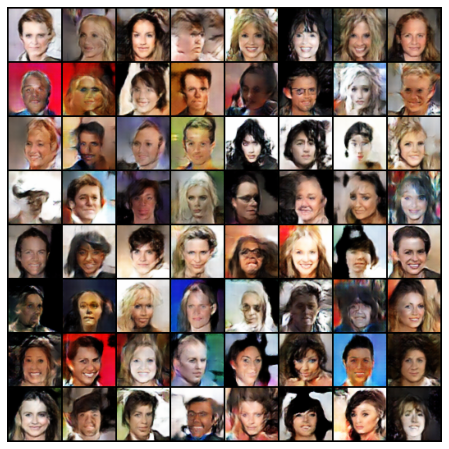

In [36]:
fig = plt.figure(figsize=(8,8))
plt.axis("off")
ims = [[plt.imshow(np.transpose(i,(1,2,0)), animated=True)] for i in img_list]
ani = animation.ArtistAnimation(fig, ims, interval=1000, repeat_delay=1000, blit=True)

HTML(ani.to_jshtml())